# BLG634E - Homework 2: Projective Transformations / Homographies

###  Bengisu Guresti - 504191557

## Task 1:

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import cv2
import moviepy.editor as mpy

from IPython.display import Video
%matplotlib inline

### Create an 572x322 pixels sized empty image.

Height: 322, Width: 572, Base Color: white, Channel size: 3

In [2]:
empty_img = np.ones((322, 572, 3), dtype=np.uint8) * 255

### For every frame of the video I extracted the corner points of each plane. Use your favourite album cover to change the video. For each plane’s correspondences, create transform matrices (Do not use OpenCV’s built-in functions. Find coefficients using 𝒒 = 𝑴−𝟏𝑨. )

All of the given 9 planes are parsed for all of the point coordinates for all of the frames. \
Target shape: \
$9 \times 472 \times 4 \times 3$ i.e. \
\# of planes $ \times $ # of frames $\times $ # of corner points $\times $ # of coordinate dimensions - x, y, z) 

In [3]:
planes = []
for plane_idx in range(1,10):
    with open("hw2_material/Plane_{}.txt".format(plane_idx)) as f:
        all_lines = f.read().splitlines() # read line by line - each line 4 corner points per frame
        frame_points = []
        # Parse corner points for each frame
        for i, line in enumerate(all_lines):
            line_points = line.split(')')
            points = []
            # Parse coordinates of points for each corner point
            for i in range(len(line_points)-1):
                coord = []
                crd = line_points[i].split(' ')
                coord.append(float(crd[0][1:]))
                coord.append(float(crd[1]))
                coord.append(float(crd[2]))
                points.append(coord)
            frame_points.append(points)
    planes.append(frame_points)
planes = np.array(planes)

In [4]:
planes.shape

(9, 472, 4, 3)

The album is selected (as in example):

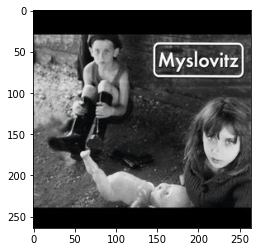

In [5]:
image = plt.imread('hw2_material/myslovitz.jpg')
plt.imshow(image)

In [6]:
image.shape

(264, 264, 3)

Source corners are defined according to the size of the image by corresponding each corner point to the ones provided in the plane data by the necessary order.

In [7]:
source_corners = np.array([[0, 0, 1], [image.shape[0]-1, 0, 1],
                           [0, image.shape[1]-1, 1],
                           [image.shape[0]-1, image.shape[1]-1, 1]])

In [8]:
source_corners

array([[  0,   0,   1],
       [263,   0,   1],
       [  0, 263,   1],
       [263, 263,   1]])

In [9]:
planes[0][0]

array([[316.7763, 129.5932, 523.4999],
       [255.2238, 129.5932, 523.4999],
       [316.7763, 191.1457, 523.4999],
       [255.2238, 191.1457, 523.4999]])

Function normalise2Dpts takes a set of points with dimension (N, 3) and normalizes them i.e. makes the origin at the centroid of all he points and mean distance from the origin  is set to $\sqrt 2$.

to_A2n function forms the A matrix necessary for homography computation. It is constrained to 4 point calculations. The solution is assumed to be in its null space and is computed by taking the last column of v in u, s, transpose(v) = A. Since svd function returns the transpose of v, its last row is taken as the solution. 

Homography calculation is done by normalizing each set of points seperately, calculating the A matrix (derived from the homomgeneous linear system), calculating the solution from A which lies in A's null space and then forming the commposite homography matrix by taking into account of normalizing source and destination points ($(T^{'})^{-1}HT$) where normalized points are: $p_{normalized} = T transpose(p)$.

The z coordinates of the destination points are directly set to 1 because we want to map the source coordinates to the given x, y targets on our plane.

In [10]:
def normalise2Dpts(points):
    saved = points
    points = points.astype(float)
    points[:, 2] = 1
    t_x = points[:, 0].mean()
    t_y = points[:, 1].mean()
    points[:, 0] -= t_x
    points[:, 1] -= t_y
    norm_mean = np.sqrt(points[:, 0] ** 2 + points[:, 1] ** 2).mean()
    scale = np.sqrt(2) / norm_mean
    points[:, 0] *= scale
    points[:, 1] *= scale
    T1 = np.array([[1, 0, -t_x],[0, 1, -t_y],[0, 0, 1]])
    T2 = np.array([[scale, 0, 0],[0, scale, 0],[0, 0, 1]])
    T3 = T2 @ T1
    return points, T3

In [11]:
def to_A2n(sources, dests):
    base_A = np.tile(sources.repeat(2, axis=0), (1, 3))
    to_A = np.array([[0, -dests[0][2], dests[0][1]],
                     [dests[0][2], 0, -dests[0][0]],
                     [0, -dests[1][2], dests[1][1]],
                     [dests[1][2], 0, -dests[1][0]],
                     [0, -dests[2][2], dests[2][1]],
                     [dests[2][2], 0, -dests[2][0]],
                     [0, -dests[3][2], dests[3][1]],
                     [dests[3][2], 0, -dests[3][0]]]).repeat(3, axis=-1)
    return to_A * base_A

In [12]:
def get_H(sources, dests):
    ndests = np.copy(dests)
    ndests[:, 2] = 1
    s_pts, s_T3 = normalise2Dpts(sources)
    t_pts, t_T3 = normalise2Dpts(ndests)
    A = to_A2n(s_pts, t_pts)
    u, s, v = np.linalg.svd(A)
    vec = v[-1].reshape(9, 1)
    H = vec.reshape((3, 3))
    H = np.linalg.inv(t_T3) @ (H @ s_T3)
    return H

Homography estimation is performed for all the frames for all the planes from the source corners to the specified target coordinates.

In [13]:
t1_list = np.array([get_H(source_corners, p_f) for p_f in planes[0]])
t2_list = np.array([get_H(source_corners, p_f) for p_f in planes[1]])
t3_list = np.array([get_H(source_corners, p_f) for p_f in planes[2]])
t4_list = np.array([get_H(source_corners, p_f) for p_f in planes[3]])
t5_list = np.array([get_H(source_corners, p_f) for p_f in planes[4]])
t6_list = np.array([get_H(source_corners, p_f) for p_f in planes[5]])
t7_list = np.array([get_H(source_corners, p_f) for p_f in planes[6]])
t8_list = np.array([get_H(source_corners, p_f) for p_f in planes[7]])
t9_list = np.array([get_H(source_corners, p_f) for p_f in planes[8]])

In [14]:
t1_list.shape

(472, 3, 3)

In [15]:
t1_list.T.shape

(3, 3, 472)

Type of warping chosen: forward. Base of source image coordinates for forward warping is defined as below:

In [16]:
source_coords = []
for i in np.linspace(0,image.shape[0]-1,image.shape[0]):
    l = []
    for j in np.linspace(0,image.shape[1]-1,image.shape[1]):
        l.append([j, i, 1])
    source_coords.append(l)
source_coords = np.array(source_coords)
source_coords.shape

(264, 264, 3)

In [17]:
source_coords.shape

(264, 264, 3)

The result coordinates for forward warping are calculated below (since the target z is 1 for 2D projections, all of the points are ensured to have z = 1):

In [18]:
tp1_list = np.array([(source_coords @ t1.T) for t1 in t1_list])
tp1_list = np.array([tp1 / tp1[:, :, 2].reshape(-1, image.shape[1], 1) for tp1 in tp1_list])

tp2_list = np.array([(source_coords @ t2.T) for t2 in t2_list])
tp2_list = np.array([tp2 / tp2[:, :, 2].reshape(-1, image.shape[1], 1) for tp2 in tp2_list])

tp3_list = np.array([(source_coords @ t3.T) for t3 in t3_list])
tp3_list = np.array([tp3 / tp3[:, :, 2].reshape(-1, image.shape[1], 1) for tp3 in tp3_list])

tp4_list = np.array([(source_coords @ t4.T) for t4 in t4_list])
tp4_list = np.array([tp4 / tp4[:, :, 2].reshape(-1, image.shape[1], 1) for tp4 in tp4_list])

tp5_list = np.array([(source_coords @ t5.T) for t5 in t5_list])
tp5_list = np.array([tp5 / tp5[:, :, 2].reshape(-1, image.shape[1], 1) for tp5 in tp5_list])

tp6_list = np.array([(source_coords @ t6.T) for t6 in t6_list])
tp6_list = np.array([tp6 / tp6[:, :, 2].reshape(-1, image.shape[1], 1) for tp6 in tp6_list])

tp7_list = np.array([(source_coords @ t7.T) for t7 in t7_list])
tp7_list = np.array([tp7 / tp7[:, :, 2].reshape(-1, image.shape[1], 1) for tp7 in tp7_list])

tp8_list = np.array([(source_coords @ t8.T) for t8 in t8_list])
tp8_list = np.array([tp8 / tp8[:, :, 2].reshape(-1, image.shape[1], 1) for tp8 in tp8_list])

tp9_list = np.array([(source_coords @ t9.T) for t9 in t9_list])
tp9_list = np.array([tp9 / tp9[:, :, 2].reshape(-1, image.shape[1], 1) for tp9 in tp9_list])

The homography calculations are check by comparing the transformed corner points of the first frame of first plane to its target:

In [19]:
dif_pt1 = tp1_list[0][source_corners[0][1]][source_corners[0][0]][:2] \
            - planes[0][0][0][:2]
dif_pt2 = tp1_list[0][source_corners[1][1]][source_corners[1][0]][:2] \
            - planes[0][0][1][:2]
dif_pt3 = tp1_list[0][source_corners[2][1]][source_corners[2][0]][:2] \
            - planes[0][0][2][:2]
dif_pt4 = tp1_list[0][source_corners[3][1]][source_corners[3][0]][:2] \
            - planes[0][0][3][:2]
dif_pt1, dif_pt2, dif_pt3, dif_pt4

(array([0., 0.]),
 array([5.68434189e-14, 0.00000000e+00]),
 array([ 0.00000000e+00, -2.84217094e-14]),
 array([0.00000000e+00, 2.84217094e-14]))

Since the error is at most on the order of e-13 for the corner cases, homography estimation is validated.

In order to obtain a correct image and video, it is necessary to determine which plane is in front of which plane. There are two methods to determine this and sort the planes: 
* By the z coordinates given in the text files
* By the heuristic that the planes on the front are larger in area in comparison to planes on the back.
The cat is assumed to be in the middle of this order, since planes form a nonagon around the cat.

Both of these methods are implemented and can be selected by setting the variable sort_by_area = True. Both of them give valid image and video outputs. However it can be seen below, where the results for these two methods are calculated for the first plane first frame, that the area heuristic can not give the true sorting thus sorting by z is better.

In [20]:
p_z = np.array([planes[0][0][:, 2].mean(),
       planes[1][0][:, 2].mean(),
       planes[2][0][:, 2].mean(),
       planes[3][0][:, 2].mean(),
       planes[4][0][:, 2].mean(),
       planes[5][0][:, 2].mean(),
       planes[6][0][:, 2].mean(),
       planes[7][0][:, 2].mean(),
       planes[8][0][:, 2].mean()])

In [21]:
p_z, np.argsort(p_z)[::-1]

(array([523.4999 , 355.1169 , 219.47335, 136.0953 , 135.55495, 224.89945,
        361.3145 , 475.57315, 475.724  ]),
 array([0, 8, 7, 6, 1, 5, 2, 3, 4]))

In [22]:
source_corners

array([[  0,   0,   1],
       [263,   0,   1],
       [  0, 263,   1],
       [263, 263,   1]])

In [23]:
p_area = np.array([np.abs(tp1_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp1_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp1_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp1_list[0][source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp2_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp2_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp2_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp2_list[0][source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp3_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp3_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp3_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp3_list[0][source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp4_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp4_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp4_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp4_list[0][source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp5_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp5_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp5_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp5_list[0][source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp6_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp6_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp6_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp6_list[0][source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp7_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp7_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp7_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp7_list[0][source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp8_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp8_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp8_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp8_list[0][source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp9_list[0][source_corners[0][1]][source_corners[0][0]][0] - tp9_list[0][source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp9_list[0][source_corners[0][1]][source_corners[0][0]][1] - tp9_list[0][source_corners[2][1]][source_corners[2][0]][1])])

In [24]:
p_area, np.argsort(p_area)

(array([ 3788.71025625,  5223.14753967,  2717.53952194, 38351.73307696,
        50200.42820169,  4727.20675548,  6746.7989953 ,  4633.19151405,
         4052.8392296 ]),
 array([2, 0, 8, 7, 5, 1, 6, 3, 4]))

Our kitty is read and resized according to the target image and video size.

In [25]:
kitty = plt.imread('hw2_material/cat-headphones.png')

In [26]:
orig_bg_h, orig_bg_w, ch = (322, 572, 4)
kitty_h, kitty_w, ch = kitty.shape
ratio = orig_bg_h / kitty.shape[-3]
small_kitty = cv2.resize(kitty, (int(kitty_w * ratio), orig_bg_h))
small_kitty_rgb = cv2.cvtColor(small_kitty, cv2.COLOR_RGBA2RGB)
small_kitty.shape

(322, 326, 4)

In [27]:
len(tp1_list)

472

Final code to obtain all the output frames. For all frames, the album is pasted onto the destination of all the planes. To sort by area set sort_by_area = True. Since getting the output for all the frames take a very long time, there is an option to only get results for a maximum number of frames. To get the output for all the frames either run task1.py from terminal (which also saves the result as a video and processing all the frames is the embeded option) or set whole_video = True. To get the output for a maximum number of frames, set whole_video = False and set max_frame = as you wish. 

Because forward warping was selected, we expect to see some holes in the resulting frames. It is necessary to use splatting to avoid this. However since there are 472 frames and 9 planes to be mapped, instead of splatting morphological operator opening is used to avoid the problem considering the computational complexity of splatting.

In [28]:
frame_list = []

sort_by_area = True

whole_video = False
max_frame = 5

for idx, (tp1, tp2, tp3, tp4, tp5, tp6, tp7, tp8, tp9) in enumerate(zip(tp1_list, tp2_list,
                                                       tp3_list, tp4_list,
                                                       tp5_list, tp6_list,
                                                       tp7_list, tp8_list,
                                                       tp9_list
                                                      )):
    print("At frame {}".format(idx, end="\r"))
    if sort_by_area:
        p_area = np.array([np.abs(tp1[source_corners[0][1]][source_corners[0][0]][0] - tp1[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp1[source_corners[0][1]][source_corners[0][0]][1] - tp1[source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp2[source_corners[0][1]][source_corners[0][0]][0] - tp2[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp2[source_corners[0][1]][source_corners[0][0]][1] - tp2[source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp3[source_corners[0][1]][source_corners[0][0]][0] - tp3[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp3[source_corners[0][1]][source_corners[0][0]][1] - tp3[source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp4[source_corners[0][1]][source_corners[0][0]][0] - tp4[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp4[source_corners[0][1]][source_corners[0][0]][1] - tp4[source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp5[source_corners[0][1]][source_corners[0][0]][0] - tp5[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp5[source_corners[0][1]][source_corners[0][0]][1] - tp5[source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp6[source_corners[0][1]][source_corners[0][0]][0] - tp6[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp6[source_corners[0][1]][source_corners[0][0]][1] - tp6[source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp7[source_corners[0][1]][source_corners[0][0]][0] - tp7[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp7[source_corners[0][1]][source_corners[0][0]][1] - tp7[source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp8[source_corners[0][1]][source_corners[0][0]][0] - tp8[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp8[source_corners[0][1]][source_corners[0][0]][1] - tp8[source_corners[2][1]][source_corners[2][0]][1]),
                  np.abs(tp9[source_corners[0][1]][source_corners[0][0]][0] - tp9[source_corners[1][1]][source_corners[1][0]][0]) * np.abs(tp9[source_corners[0][1]][source_corners[0][0]][1] - tp9[source_corners[2][1]][source_corners[2][0]][1])])
        p_area = np.append(p_area, p_area.mean())
        sorted_planes = np.argsort(p_area)
    else:
        p_z = np.array([planes[0][idx][:, 2].mean(),
                       planes[1][idx][:, 2].mean(),
                       planes[2][idx][:, 2].mean(),
                       planes[3][idx][:, 2].mean(),
                       planes[4][idx][:, 2].mean(),
                       planes[5][idx][:, 2].mean(),
                       planes[6][idx][:, 2].mean(),
                       planes[7][idx][:, 2].mean(),
                       planes[8][idx][:, 2].mean()])
        p_z = np.append(p_z, p_z.mean())
        sorted_planes = np.argsort(p_z)[::-1]

    frame = np.ones((322, 572, 3), dtype=np.uint8) * 255
    
    for p_idx in sorted_planes:
        if p_idx == 0:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp1[i][j][1]))][int(np.around(tp1[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp1[i][j][1]))][int(np.around(tp1[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp1[i][j][1]))][int(np.around(tp1[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 1:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp2[i][j][1]))][int(np.around(tp2[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp2[i][j][1]))][int(np.around(tp2[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp2[i][j][1]))][int(np.around(tp2[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 2:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp3[i][j][1]))][int(np.around(tp3[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp3[i][j][1]))][int(np.around(tp3[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp3[i][j][1]))][int(np.around(tp3[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 3:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp4[i][j][1]))][int(np.around(tp4[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp4[i][j][1]))][int(np.around(tp4[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp4[i][j][1]))][int(np.around(tp4[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 4:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp5[i][j][1]))][int(np.around(tp5[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp5[i][j][1]))][int(np.around(tp5[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp5[i][j][1]))][int(np.around(tp5[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 5:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp6[i][j][1]))][int(np.around(tp6[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp6[i][j][1]))][int(np.around(tp6[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp6[i][j][1]))][int(np.around(tp6[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 6:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp7[i][j][1]))][int(np.around(tp7[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp7[i][j][1]))][int(np.around(tp7[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp7[i][j][1]))][int(np.around(tp7[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 7:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp8[i][j][1]))][int(np.around(tp8[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp8[i][j][1]))][int(np.around(tp8[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp8[i][j][1]))][int(np.around(tp8[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 8:
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    frame[int(np.around(tp9[i][j][1]))][int(np.around(tp9[i][j][0]))][0] = image[i][j][0]
                    frame[int(np.around(tp9[i][j][1]))][int(np.around(tp9[i][j][0]))][1] = image[i][j][1]
                    frame[int(np.around(tp9[i][j][1]))][int(np.around(tp9[i][j][0]))][2] = image[i][j][2]
        elif p_idx == 9:
            move_x = (572 - 326) // 2
            for i in range(322):
                for j in range(326):
                    if small_kitty[i][j][3] > 0:
                        frame[i][j + move_x][0] = int(small_kitty_rgb[i][j][0] * 255)
                        frame[i][j + move_x][1] = int(small_kitty_rgb[i][j][1] * 255)
                        frame[i][j + move_x][2] = int(small_kitty_rgb[i][j][2] * 255)
    opened_frame = cv2.morphologyEx(frame, cv2.MORPH_OPEN, np.ones((2,2),np.uint8))
    frame_list.append(opened_frame)
    if whole_video is False and idx == max_frame - 1:
        break
frame_list = np.array(frame_list)
frame_list.shape

At frame 0
At frame 1
At frame 2
At frame 3
At frame 4


(5, 322, 572, 3)

Text(0.5, 1.0, 'First frame of the video')

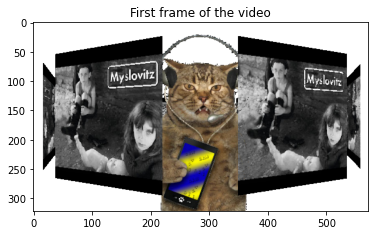

In [29]:
plt.imshow(frame_list[0])
plt.title("First frame of the video")

In [30]:
clip = mpy.ImageSequenceClip(list(frame_list), fps = 15)
clip.write_videofile("last_video_kframes.mp4", codec="libx264")

Moviepy - Building video last_video_kframes.mp4.
Moviepy - Writing video last_video_kframes.mp4

Moviepy - Done !
Moviepy - video ready last_video_kframes.mp4


### Video result for first k (5 frames) (sorted by area):

In [31]:
Video('last_video_kframes.mp4', embed=True)

### Video result with all of the frames (sorted by z)

In [32]:
Video('task1_z.mp4', embed=True)

### Video result with all of the frames (sorted by area)

In [33]:
Video('task1_area.mp4', embed=True)

### While the example augmented image looks pretty good, there may be a pixelation effect on the edges of the album cover, making the image look somewhat synthetically generated. How might this be improved? Explain in few sentences.

 * When experimented, using filters to smoothen the image such as gaussian blur, median filter or bilateral filter or opening/closing operations did not give much improvement for pixelation for this album but can be used on other cases of images.
 * The target destination image can be chosen with greater resolution so that the number of pixels are increased and we would see the pixelation effect lessen for our target height and width.
 * Instead of forward warping, we can use backward/inverse warping with bilinear interpolation of source pixels. Because the bilinear interpolation would smoothen the pixels when they are being mapped to the destination, pixelation effect may be improved.

## Task 2:

In this task, you will implement and experiment with estimation of a Homography matrix between images of a given scene (planar scene) from different views. You will use the Normalized Direct Linear Transform with SVD we studied in the class to estimate the 3x3 Homography matrix H. You will then use the estimated transformation to form a panoramic image, i.e. a combination of the three images by simple stitching. 

In this task, you will select the corresponding points from the images manually, i.e. by clicking on the point with a mouse.

First, work on this assignment by using two images. Then add the third image.

2.1. Load the pier images given in Figure 2. Try to choose rich interest points such as corners that are visible in both images. What is the minimum number of corresponding feature points to be selected from the images? Due to noise in measurements, you should try to choose more than 4, e.g. I chose 6 or 7 points.

Text(0.5, 1.0, 'Pier 1')

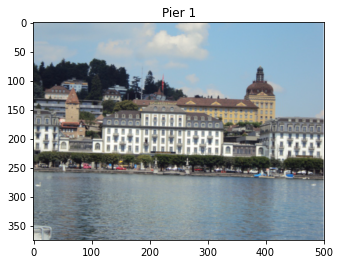

In [34]:
pier1 = plt.imread('hw2_material/1.JPG')
plt.imshow(pier1)
plt.title("Pier 1")

Text(0.5, 1.0, 'Pier 2')

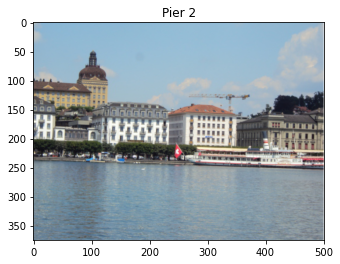

In [35]:
pier2 = plt.imread('hw2_material/2.JPG')
plt.imshow(pier2)
plt.title("Pier 2")

Text(0.5, 1.0, 'Pier 3')

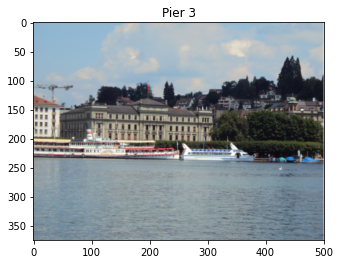

In [36]:
pier3 = plt.imread('hw2_material/3.JPG')
plt.imshow(pier3)
plt.title("Pier 3")

The function normalise2Dpts written for Task 1 is compatible to Task 2 with more than 4 point correspondences. It is given again below. Please go back to explanation in Task 1 for purpose of this function.

In [37]:
def normalise2Dpts(points):
    saved = points
    points = points.astype(float)
    points[:, 2] = 1
    t_x = points[:, 0].mean()
    t_y = points[:, 1].mean()
    points[:, 0] -= t_x
    points[:, 1] -= t_y
    norm_mean = np.sqrt(points[:, 0] ** 2 + points[:, 1] ** 2).mean()
    scale = np.sqrt(2) / norm_mean
    points[:, 0] *= scale
    points[:, 1] *= scale
    T1 = np.array([[1, 0, -t_x],[0, 1, -t_y],[0, 0, 1]])
    T2 = np.array([[scale, 0, 0],[0, scale, 0],[0, 0, 1]])
    T3 = T2 @ T1
    return points, T3

get_A2n function forms the A matrix necessary for homography computation. In Task 2, it is not constrained to 4 point calculations and can get an arbitrary number of points. The solution is assumed to be in its null space and is computed by taking the last column of v in u, s, transpose(v) = A. Since svd function returns the transpose of v, its last row is taken as the solution.

In [38]:
def get_A2n(sources, dests):
    base_A = np.tile(sources.repeat(2, axis=0), (1, 3))
    to_A = []
    for dest in dests:
        to_A.append([0, -dest[2], dest[1]])
        to_A.append([dest[2], 0, -dest[0]])
    to_A = np.array(to_A).repeat(3, axis=-1)
    return to_A * base_A

Homography calculation is done by normalizing each set of points seperately, calculating the A matrix (derived from the homomgeneous linear system), calculating the solution from A which lies in A's null space and then forming the commposite homography matrix by taking into account of normalizing source and destination points ($(T^{'})^{-1}HT$) where normalized points are: $p_{normalized} = T transpose(p)$.

In [39]:
def homography2D(sources, dests):
    ndests = np.copy(dests)
    ndests[:, 2] = 1
    s_pts, s_T3 = normalise2Dpts(sources)
    t_pts, t_T3 = normalise2Dpts(ndests)
    A = get_A2n(s_pts, t_pts)
    u, s, v = np.linalg.svd(A)
    vec = v[-1].reshape(9, 1)
    H = vec.reshape((3, 3))
    H = np.linalg.inv(t_T3) @ (H @ s_T3)
    return H

Corresponding points are selected manually using ginput function of matplotlib. After clicking the points manually, this function provides those points' coordinates. You can see mark_img.py for this purpose. If you want to try it out, run it by setting the following arguments: --image-path, --result-path, --n (number of points/clicks), --time-out (maximum number of seconds to wait for input)

The manually selected points are read from text for pier1 to pier 2 correspondence. 8 points are selected.

In [40]:
points1 = np.loadtxt('result11.txt')
points1 = np.hstack((points1, np.ones((points1.shape[0], 1))))
points2 = np.loadtxt('result22.txt')
points2 = np.hstack((points2, np.ones((points2.shape[0], 1))))

In [41]:
pier1.shape

(375, 501, 3)

The selected points' coordinates for points1 and points 2:

In [42]:
points1

array([[399.93686869, 213.31222944,   1.        ],
       [327.50496032, 211.62121212,   1.        ],
       [399.93686869, 231.34974747,   1.        ],
       [326.94128788, 230.50423882,   1.        ],
       [416.28336941, 126.7885101 ,   1.        ],
       [371.18957431, 126.22483766,   1.        ],
       [416.56520563, 134.96176046,   1.        ],
       [371.18957431, 134.1162518 ,   1.        ]])

In [43]:
points2

array([[111.05474387, 186.81962482,   1.        ],
       [ 37.77732684, 184.00126263,   1.        ],
       [110.49107143, 204.57530664,   1.        ],
       [ 37.2136544 , 203.16612554,   1.        ],
       [127.68308081, 101.42325036,   1.        ],
       [ 83.99846681,  99.45039683,   1.        ],
       [128.24675325, 109.03282828,   1.        ],
       [ 82.87112193, 106.77813853,   1.        ]])

In [44]:
H11 = homography2D(points1, points2)

Computed homography matrix H11:

In [45]:
H11

array([[-5.87738367e-01,  1.25505995e-02,  1.68222868e+02],
       [-3.23609496e-02, -5.69595381e-01,  2.64416917e+01],
       [-1.34076027e-04,  5.02721578e-05, -5.35823546e-01]])

Homography computation is validated by checking the manuelly matched points:

In [46]:
c_p = points1 @ H11.T
c_p /= c_p[:, 2].reshape(-1, 1)
c_p

array([[110.8618587 , 186.62213999,   1.        ],
       [ 37.96970949, 183.9676346 ,   1.        ],
       [110.64404887, 204.69593931,   1.        ],
       [ 37.03783343, 203.20113495,   1.        ],
       [127.89384869, 101.23270973,   1.        ],
       [ 83.47977199,  99.21083976,   1.        ],
       [128.08325843, 109.27240083,   1.        ],
       [ 83.36588385, 107.04409669,   1.        ]])

In [47]:
c_p - points2

array([[-0.19288516, -0.19748483,  0.        ],
       [ 0.19238265, -0.03362802,  0.        ],
       [ 0.15297744,  0.12063268,  0.        ],
       [-0.17582097,  0.03500941,  0.        ],
       [ 0.21076788, -0.19054063,  0.        ],
       [-0.51869482, -0.23955706,  0.        ],
       [-0.16349481,  0.23957254,  0.        ],
       [ 0.49476192,  0.26595816,  0.        ]])

The error is relatively small and mostly attributed to error during manuel matching. Homography computation is validated.

Type of warping chosen: forward. Base of source image coordinates for forward warping is defined as below:

In [48]:
source_coords1 = []
for i in np.linspace(0,pier1.shape[0]-1,pier1.shape[0]):
    l = []
    for j in np.linspace(0,pier1.shape[1]-1,pier1.shape[1]):
        l.append([j, i, 1])
    source_coords1.append(l)
source_coords1 = np.array(source_coords1)
source_coords1.shape

(375, 501, 3)

In [49]:
pier1_matched = (source_coords1 @ H11.T)
pier1_matched /= pier1_matched[:, :, 2].reshape((-1, source_coords1.shape[1], 1))

In [50]:
pier1_matched.shape

(375, 501, 3)

For the following panorama, a naive splatting is used to eliminate the holes during forward warping. In this naive splatting, the pixel value is distributed to the 4 neighboring empty target pixels. Since the quality of this naive splatting is worse than the result with morphological operator closing, closing operator will be used in the rest of the assignment.

The boundary is found by getting the minimum and maximum x and y target coordinates from the sources image. Since for pier1 to pier2 the maximum coordinates do not excess target shape but minimum coordinates do, frame base is adjusted accordingly. 1 pixel is added to both dimensions just to be safe.

In [51]:
pan1_splat = np.zeros((pier2.shape[0] + int((-pier1_matched[:, :, 1].min())) + 1, pier2.shape[1] + int((-pier1_matched[:, :, 0].min())) + 1, 3), dtype=np.uint8) * 255

h_offset = int((-pier1_matched[:, :, 1].min()))  
w_offset = int((-pier1_matched[:, :, 0].min()))

In [52]:
pan1_splat.shape, pier1.shape, pier2.shape, h_offset, w_offset

((425, 836, 3), (375, 501, 3), (375, 501, 3), 49, 334)

In [53]:
for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan1_splat[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan1_splat[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan1_splat[h_offset + i][w_offset + j][2] = pier2[i][j][2]    

for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        pan1_splat[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = pier1[i][j][0]
        pan1_splat[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = pier1[i][j][1]
        pan1_splat[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = pier1[i][j][2]
        
        if (pan1_splat[h_offset + int((pier1_matched[i][j][1])) + 1][w_offset + int((pier1_matched[i][j][0]))] == np.array([0, 0, 0], dtype=np.uint8)).all():
            pan1_splat[h_offset + int((pier1_matched[i][j][1])) + 1][w_offset + int((pier1_matched[i][j][0]))][0] = pier1[i][j][0]
            pan1_splat[h_offset + int((pier1_matched[i][j][1])) + 1][w_offset + int((pier1_matched[i][j][0]))][1] = pier1[i][j][1]
            pan1_splat[h_offset + int((pier1_matched[i][j][1])) + 1][w_offset + int((pier1_matched[i][j][0]))][2] = pier1[i][j][2]
            
        if (pan1_splat[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0])) + 1] == np.array([0, 0, 0], dtype=np.uint8)).all():
            pan1_splat[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0])) + 1][0] = pier1[i][j][0]
            pan1_splat[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0])) + 1][1] = pier1[i][j][1]
            pan1_splat[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0])) + 1][2] = pier1[i][j][2]
            
        if (pan1_splat[h_offset + int((pier1_matched[i][j][1])) + 1][w_offset + int((pier1_matched[i][j][0])) + 1] == np.array([0, 0, 0], dtype=np.uint8)).all():
            pan1_splat[h_offset + int((pier1_matched[i][j][1])) + 1][w_offset + int((pier1_matched[i][j][0])) + 1][0] = pier1[i][j][0]
            pan1_splat[h_offset + int((pier1_matched[i][j][1])) + 1][w_offset + int((pier1_matched[i][j][0])) + 1][1] = pier1[i][j][1]
            pan1_splat[h_offset + int((pier1_matched[i][j][1])) + 1][w_offset + int((pier1_matched[i][j][0])) + 1][2] = pier1[i][j][2]

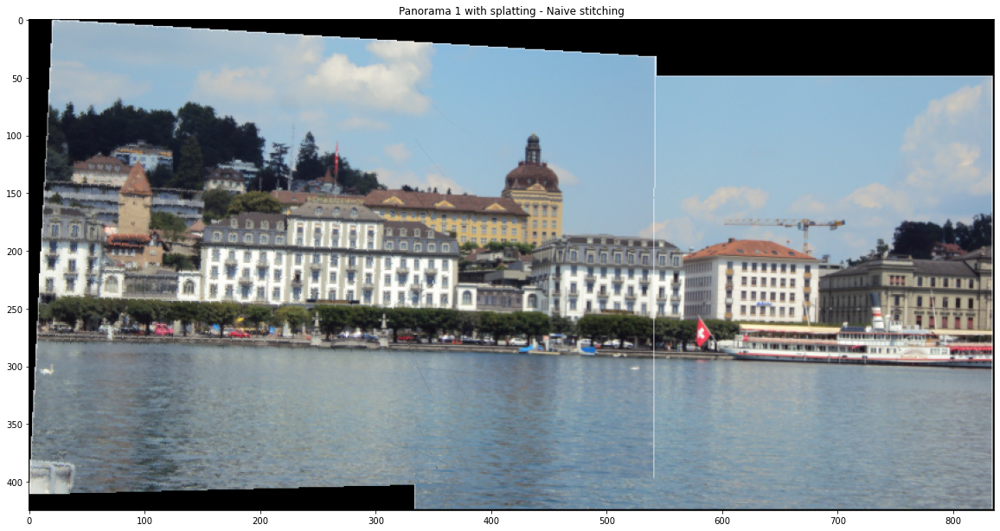

In [54]:
plt.figure(figsize = (20, 20))
plt.imshow(pan1_splat)
plt.title("Panorama 1 with splatting - Naive stitching")
plt.savefig('pan1_splat_naivestitch')

For the following panorama (and for the rest), closing operation is used to eliminate the holes during forward warping. It gives better quality than previous naive splatting.

In [55]:
pan1 = np.zeros((pier2.shape[0] + int((-pier1_matched[:, :, 1].min())) + 1, pier2.shape[1] + int((-pier1_matched[:, :, 0].min())) + 1, 3), dtype=np.uint8) * 255

h_offset = int((-pier1_matched[:, :, 1].min()))  
w_offset = int((-pier1_matched[:, :, 0].min()))

In [56]:
pan1.shape, pier1.shape, pier2.shape, h_offset, w_offset

((425, 836, 3), (375, 501, 3), (375, 501, 3), 49, 334)

In [57]:
for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan1[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan1[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan1[h_offset + i][w_offset + j][2] = pier2[i][j][2]    

for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        pan1[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = pier1[i][j][0]
        pan1[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = pier1[i][j][1]
        pan1[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = pier1[i][j][2]
        
pan1 = cv2.morphologyEx(pan1, cv2.MORPH_CLOSE, np.ones((2,2), np.uint8))

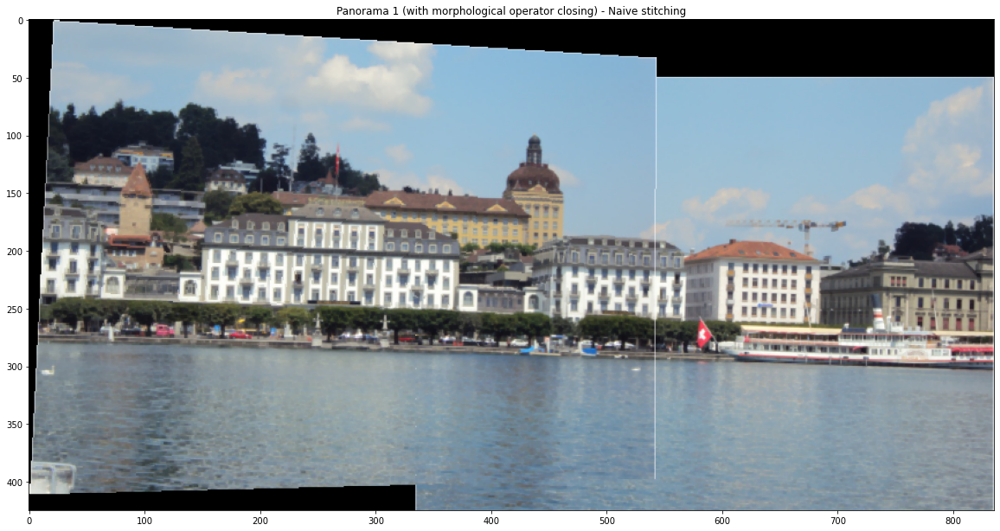

In [58]:
plt.figure(figsize = (20, 20))
plt.imshow(pan1)
plt.title("Panorama 1 (with morphological operator closing) - Naive stitching")
plt.savefig('pan1_close_naivestitch')

### Image Blending: 

#### Rather than copying the second image over the first one as you did before, try simple image blending ideas, such as taking convex combinations of images etc.
#### How does the result differ from that of simple copying?

This time, image blending is performed by taking convex combination of first and second image for the intersecting pixels. For blending two different techniques are experimented:

1. Simple averaging : coefficients for each image pixel is 0.5
2. While taking the convex combination of intersecting pixels, distance to each border is taken into account. Distance of intersecting coordinates to the intersecting x borders in terms of x coordinates is calculated. Then each pixel of the image is combined / normalized such that the image which the pixel coordinate is further away from its border effects the pixel value more in a linear rate.

In [59]:
pan21 = np.zeros((pier2.shape[0] + int(np.around(-pier1_matched[:, :, 1].min())), pier2.shape[1] + int(np.around(-pier1_matched[:, :, 0].min())), 3), dtype=np.uint8) * 255

h_offset = int((-pier1_matched[:, :, 1].min()))  
w_offset = int((-pier1_matched[:, :, 0].min()))

for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan21[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan21[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan21[h_offset + i][w_offset + j][2] = pier2[i][j][2]
                     
for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        if int((pier1_matched[i][j][1])) > 0 and int((pier1_matched[i][j][0])) > 0:
            a2 = 0.5
            a1 = 0.5
            pan21[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = a1 * pier1[i][j][0] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][0]
            pan21[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = a1 * pier1[i][j][1] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][1]
            pan21[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = a1 * pier1[i][j][2] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][2]
        else:
            pan21[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = pier1[i][j][0]
            pan21[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = pier1[i][j][1]
            pan21[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = pier1[i][j][2]

pan21 = cv2.morphologyEx(pan21, cv2.MORPH_CLOSE, np.ones((2,2),np.uint8))

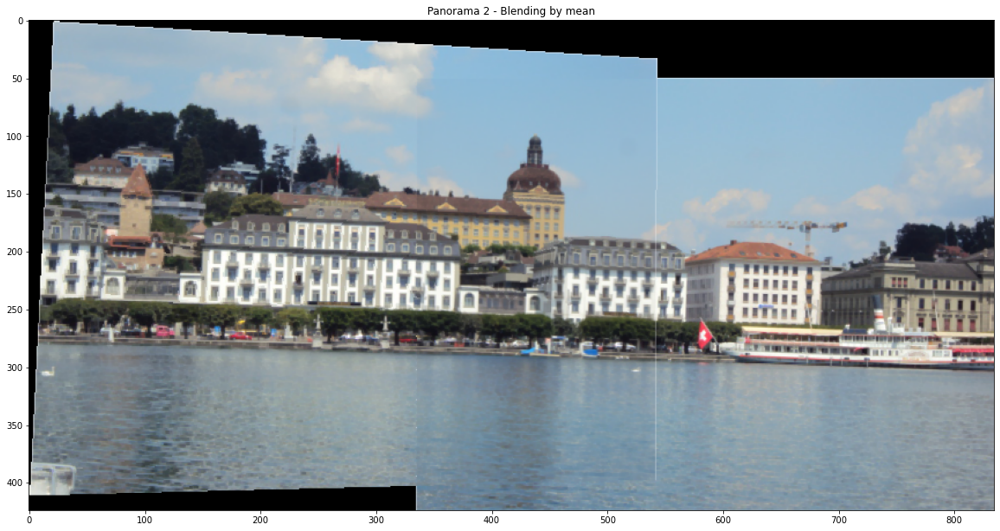

In [60]:
plt.figure(figsize = (20, 20))
plt.imshow(pan21)
plt.title("Panorama 2 - Blending by mean")
plt.savefig('pan2_close_blending_mean')

In [61]:
pan22 = np.zeros((pier2.shape[0] + int(np.around(-pier1_matched[:, :, 1].min())), pier2.shape[1] + int(np.around(-pier1_matched[:, :, 0].min())), 3), dtype=np.uint8) * 255

h_offset = int((-pier1_matched[:, :, 1].min()))  
w_offset = int((-pier1_matched[:, :, 0].min()))

max_x = int((pier1_matched[:, :, 0].max()))

for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan22[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan22[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan22[h_offset + i][w_offset + j][2] = pier2[i][j][2]
                     
for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        if int((pier1_matched[i][j][1])) > 0 and int((pier1_matched[i][j][0])) > 0:
            d_x = int((pier1_matched[i][j][0]))
            a2 = d_x / max_x
            a1 = 1 - a2
            pan22[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = a1 * pier1[i][j][0] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][0]
            pan22[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = a1 * pier1[i][j][1] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][1]
            pan22[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = a1 * pier1[i][j][2] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][2]
        else:
            pan22[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = pier1[i][j][0]
            pan22[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = pier1[i][j][1]
            pan22[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = pier1[i][j][2]

pan22 = cv2.morphologyEx(pan22, cv2.MORPH_CLOSE, np.ones((2,2),np.uint8))

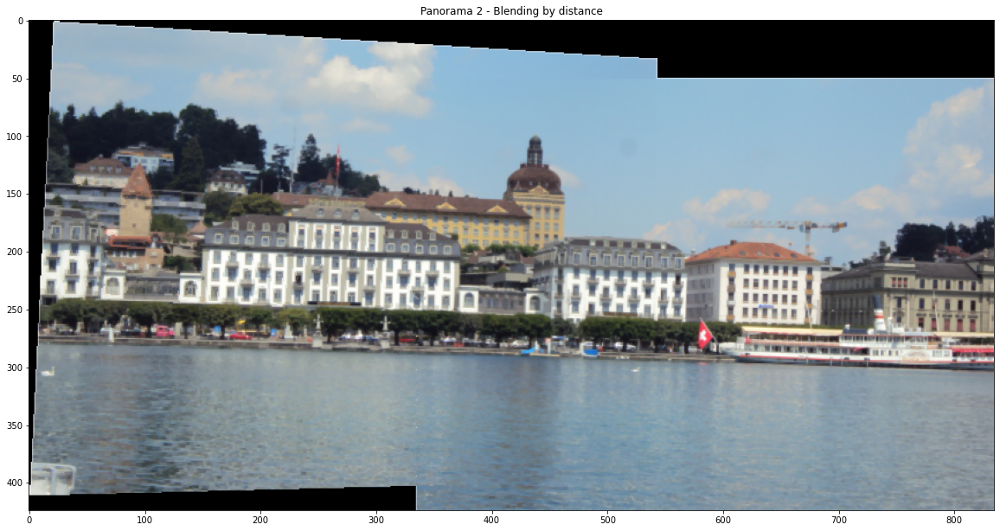

In [62]:
plt.figure(figsize = (20, 20))
plt.imshow(pan22)
plt.title("Panorama 2 - Blending by distance")
plt.savefig('pan22_close_blending_distance')

In simple copying, it is very easy to determine which image is copied on which one. This is because usually the lighting conditions in the images are different and therefore the transition from one image to the other is very sharp. When blending by taking the mean is used, the transitions are less sharp (half the sharpness of before) but since the lighting is constant it looks like a 3rd image is copied into the intersection. In order to improve this the other method is used: blending by proportioning according to border distances. The result of this gives the smoothest transition and the transient condition of the lighting continues until the intersecting coordinates end. Since the last method, blending by distance, gives the best results, it is used in Task 3 and Task 4 as the blending method.

## Task 3:

### In order to create a panoramic image, typically more than 2 images are used. In this task, you will stitch 3 images to create a panorama. To do that, estimate the homography matrices by taking the center image as your reference and estimate the homographies from the other two images towards the center image. Then repeat what you did in Task 2. Show your final panorama image constructed using 3 images.


The manually selected points are read from text for pier3 to pier 2 correspondence. 8 points are selected.

In [63]:
points23 = np.loadtxt('result232.txt')
points23 = np.hstack((points23, np.ones((points23.shape[0], 1))))
points33 = np.loadtxt('result332.txt')
points33 = np.hstack((points33, np.ones((points33.shape[0], 1))))

In [64]:
H32 = homography2D(points33, points23)

Homography computation is validated by checking the manuelly matched points:

In [65]:
c_p3 = points33 @ H32.T
c_p3 /= c_p3[:, 2].reshape(-1, 1)
c_p3

array([[483.85903831, 176.55350955,   1.        ],
       [435.82361521, 174.84503509,   1.        ],
       [483.60037514, 183.97312074,   1.        ],
       [434.65130284, 181.74326849,   1.        ],
       [484.24238686, 192.57524002,   1.        ],
       [435.41226934, 190.60824934,   1.        ],
       [483.99085352, 201.5044049 ,   1.        ],
       [434.78177721, 198.95462756,   1.        ]])

In [66]:
c_p3 - points23

array([[ 0.21681248,  0.16182485,  0.        ],
       [ 0.37538289, -0.13746851,  0.        ],
       [-0.32368691, -0.02814189,  0.        ],
       [-0.51509327, -0.00330438,  0.        ],
       [ 0.03648859, -0.44478162,  0.        ],
       [-0.03596299,  0.40658989,  0.        ],
       [ 0.06679147,  0.31113289,  0.        ],
       [ 0.17905354, -0.26579091,  0.        ]])

The error is relatively small and mostly attributed to error during manuel matching. Homography computation is validated.

Type of warping chosen: forward. Base of source image coordinates for forward warping is defined as below:

In [67]:
source_coords3 = []
for i in np.linspace(0,pier3.shape[0]-1,pier3.shape[0]):
    l = []
    for j in np.linspace(0,pier3.shape[1]-1,pier3.shape[1]):
        l.append([j, i, 1])
    source_coords3.append(l)
source_coords3 = np.array(source_coords3)
source_coords3.shape

(375, 501, 3)

In [68]:
pier3_matched = (source_coords3 @ H32.T)
pier3_matched /= pier3_matched[:, :, 2].reshape(-1, pier3.shape[1], 1)

The boundary is found by getting the minimum and maximum x and y target coordinates from the sources image. Since for pier1 to pier2 the maximum coordinates do not excess target shape but minimum coordinates do, frame base is adjusted accordingly. Since for pier3 to pier2 the minimum coordinates do not excess target shape but maximum coordinates do, frame base is adjusted accordingly. The bound for x and y coordinates are the sum of the amount mapped pier1 excesses pier 2 shape and the amount mapped pier3 excesses pier2. 1 pixel is added to both dimensions just to be safe.

### Without blending (simple copying):

In [69]:
pan31 = np.zeros((int((-pier1_matched[:, :, 1].min())) + int((pier3_matched[:, :, 1].max())) + 1, int((-pier1_matched[:, :, 0].min())) + int((pier3_matched[:, :, 0].max())) + 1, 3), dtype=np.uint8) * 255

h_offset = int((-pier1_matched[:, :, 1].min()))  
w_offset = int((-pier1_matched[:, :, 0].min()))

for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan31[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan31[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan31[h_offset + i][w_offset + j][2] = pier2[i][j][2]
                     
for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        pan31[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = pier1[i][j][0]
        pan31[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = pier1[i][j][1]
        pan31[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = pier1[i][j][2]

for i in range(pier3.shape[0]):
    for j in range(pier3.shape[1]):
        pan31[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][0] = pier3[i][j][0]
        pan31[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][1] = pier3[i][j][1]
        pan31[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][2] = pier3[i][j][2]

pan31 = cv2.morphologyEx(pan31, cv2.MORPH_CLOSE, np.ones((2,2), np.uint8))

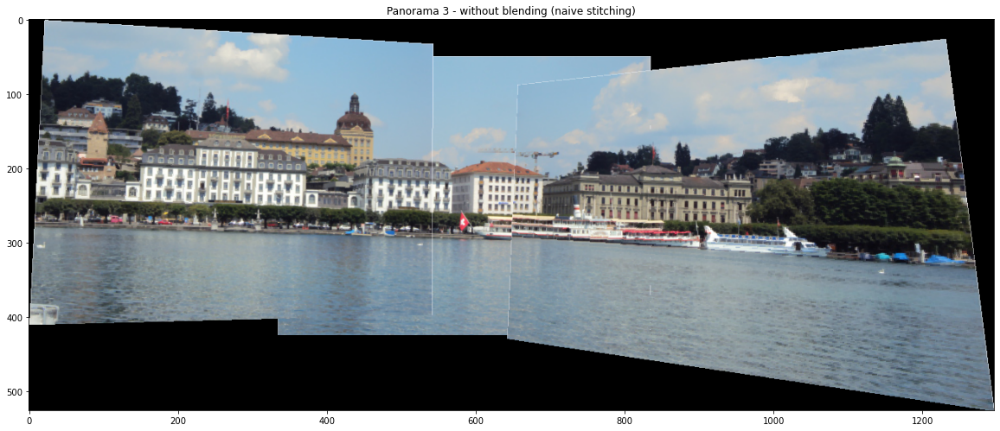

In [70]:
plt.figure(figsize = (20, 20))
plt.imshow(pan31)
plt.title("Panorama 3 - without blending (naive stitching)")
plt.savefig('pan31_close_naivestitch')

### With blending (by distance):

In [71]:
pan32 = np.zeros((int((-pier1_matched[:, :, 1].min())) + int((pier3_matched[:, :, 1].max())) + 1, int((-pier1_matched[:, :, 0].min())) + int((pier3_matched[:, :, 0].max())) + 1, 3), dtype=np.uint8) * 255

h_offset = int((-pier1_matched[:, :, 1].min()))  
w_offset = int((-pier1_matched[:, :, 0].min()))

max_x1 = int((pier1_matched[:, :, 0].max()))

h_offset3 = int((-pier3_matched[:, :, 1].min()))  
w_offset3 = int((-pier3_matched[:, :, 0].min()))

min_x1 = int((pier3_matched[:, :, 0].min()))

for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan32[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan32[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan32[h_offset + i][w_offset + j][2] = pier2[i][j][2]
                     
for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        if int((pier1_matched[i][j][1])) >= 0 and int((pier1_matched[i][j][0])) >= 0:
            d_x = int((pier1_matched[i][j][0]))
            a2 = d_x / max_x1
            a1 = 1 - a2
            pan32[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = a1 * pier1[i][j][0] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][0]
            pan32[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = a1 * pier1[i][j][1] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][1]
            pan32[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = a1 * pier1[i][j][2] + a2 * pier2[int((pier1_matched[i][j][1]))][int((pier1_matched[i][j][0]))][2]
        else:
            pan32[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][0] = pier1[i][j][0]
            pan32[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][1] = pier1[i][j][1]
            pan32[h_offset + int((pier1_matched[i][j][1]))][w_offset + int((pier1_matched[i][j][0]))][2] = pier1[i][j][2]

for i in range(pier3.shape[0]):
    for j in range(pier3.shape[1]):
        if int((pier3_matched[i][j][1])) < pier3.shape[0] and int((pier3_matched[i][j][0])) < pier3.shape[1]:
            d_x = pier2.shape[1] - int((pier3_matched[i][j][0]))
            a2 = d_x / (pier2.shape[1] - min_x1)
            a1 = 1 - a2
            pan32[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][0] = a1 * pier3[i][j][0] + a2 * pier2[int((pier3_matched[i][j][1]))][int((pier3_matched[i][j][0]))][0]
            pan32[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][1] = a1 * pier3[i][j][1] + a2 * pier2[int((pier3_matched[i][j][1]))][int((pier3_matched[i][j][0]))][1]
            pan32[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][2] = a1 * pier3[i][j][2] + a2 * pier2[int((pier3_matched[i][j][1]))][int((pier3_matched[i][j][0]))][2]
        else:
            pan32[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][0] = pier3[i][j][0]
            pan32[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][1] = pier3[i][j][1]
            pan32[h_offset + int((pier3_matched[i][j][1]))][w_offset + int((pier3_matched[i][j][0]))][2] = pier3[i][j][2]

pan32 = cv2.morphologyEx(pan32, cv2.MORPH_CLOSE, np.ones((2,2), np.uint8))

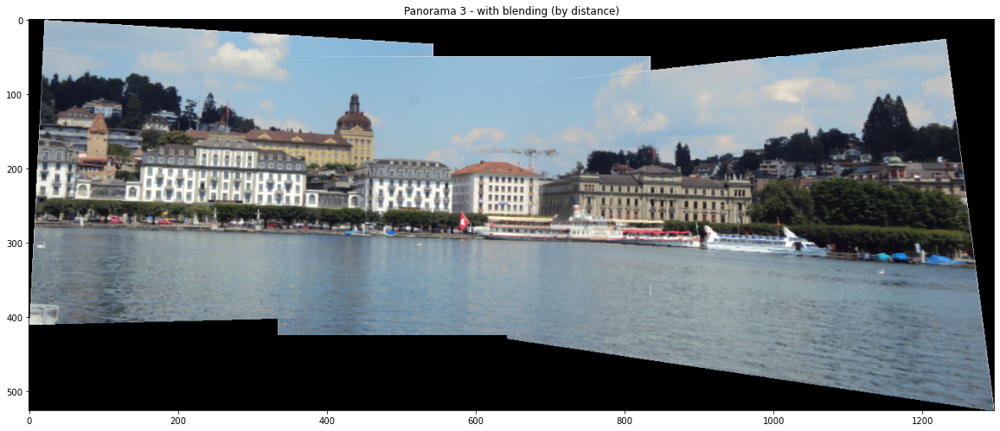

In [72]:
plt.figure(figsize = (20, 20))
plt.imshow(pan32)
plt.title("Panorama 3 - with blending (by distance)")
plt.savefig('pan32_close_blending')

## Task 4:

In this task, you will use a feature extraction and matching technique based on a technique such as SIFT to automatically extract a set of corresponding point coordinates from the given images. You can use a built-in function or already available routine from another library to do this task. Using the extracted feature point sets, estimate the Homography matrix as in Task 2.2.

SIFT is used from python OpenCV as instructed in its sift feature mathing and homography tutorial.

#### With Pier Panaroma without RANSAC

In [73]:
sift = cv2.xfeatures2d.SIFT_create()

In [74]:
keypoints_1, descriptors_1 = sift.detectAndCompute(pier1, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(pier2, None)
keypoints_3, descriptors_3 = sift.detectAndCompute(pier3, None)

In [75]:
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

In [76]:
matches12 = flann.knnMatch(descriptors_1, descriptors_2, k=2)

good12 = []
for m, n in matches12:
    if m.distance < 0.2 * n.distance:
        good12.append(m)
        
query12 = [[keypoints_1[match.queryIdx].pt[0], keypoints_1[match.queryIdx].pt[1], 1] for match in good12]
query12 = np.array(query12)
train12 = [[keypoints_2[match.trainIdx].pt[0], keypoints_2[match.trainIdx].pt[1], 1] for match in good12]
train12 = np.array(train12)

matches32 = flann.knnMatch(descriptors_3, descriptors_2, k=2)

good32 = []
for m, n in matches32:
    if m.distance < 0.2 * n.distance:
        good32.append(m)
        
query32 = [[keypoints_3[match.queryIdx].pt[0], keypoints_3[match.queryIdx].pt[1], 1] for match in good32]
query32 = np.array(query32)
train32 = [[keypoints_2[match.trainIdx].pt[0], keypoints_2[match.trainIdx].pt[1], 1] for match in good32]
train32 = np.array(train32)

In [77]:
len(good12), len(good32)

(105, 146)

In [78]:
H412 = homography2D(query12, train12)
H432 = homography2D(query32, train32)

In [79]:
source_coords41 = []
for i in np.linspace(0,pier1.shape[0]-1,pier1.shape[0]):
    l = []
    for j in np.linspace(0,pier1.shape[1]-1,pier1.shape[1]):
        l.append([j, i, 1])
    source_coords41.append(l)
source_coords41 = np.array(source_coords41)
source_coords41.shape

(375, 501, 3)

In [80]:
pier41_matched = (source_coords41 @ H412.T)
pier41_matched /= pier41_matched[:, :, 2].reshape((-1, source_coords41.shape[1], 1))

In [81]:
pan41 = np.zeros((pier2.shape[0] + int((-pier41_matched[:, :, 1].min())), pier2.shape[1] + int((-pier41_matched[:, :, 0].min())), 3), dtype=np.uint8) * 255

h_offset = int((-pier41_matched[:, :, 1].min()))  
w_offset = int((-pier41_matched[:, :, 0].min()))

max_x = int((pier41_matched[:, :, 0].max()))

for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan41[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan41[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan41[h_offset + i][w_offset + j][2] = pier2[i][j][2]
                     
for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        if int((pier41_matched[i][j][1])) > 0 and int((pier41_matched[i][j][0])) > 0:
            d_x = int((pier41_matched[i][j][0]))
            a2 = d_x / max_x
            a1 = 1 - a2
            pan41[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][0] = a1 * pier1[i][j][0] + a2 * pier2[int((pier41_matched[i][j][1]))][int((pier41_matched[i][j][0]))][0]
            pan41[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][1] = a1 * pier1[i][j][1] + a2 * pier2[int((pier41_matched[i][j][1]))][int((pier41_matched[i][j][0]))][1]
            pan41[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][2] = a1 * pier1[i][j][2] + a2 * pier2[int((pier41_matched[i][j][1]))][int((pier41_matched[i][j][0]))][2]
        else:
            pan41[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][0] = pier1[i][j][0]
            pan41[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][1] = pier1[i][j][1]
            pan41[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][2] = pier1[i][j][2]

pan41 = cv2.morphologyEx(pan41, cv2.MORPH_CLOSE, np.ones((2,2),np.uint8))

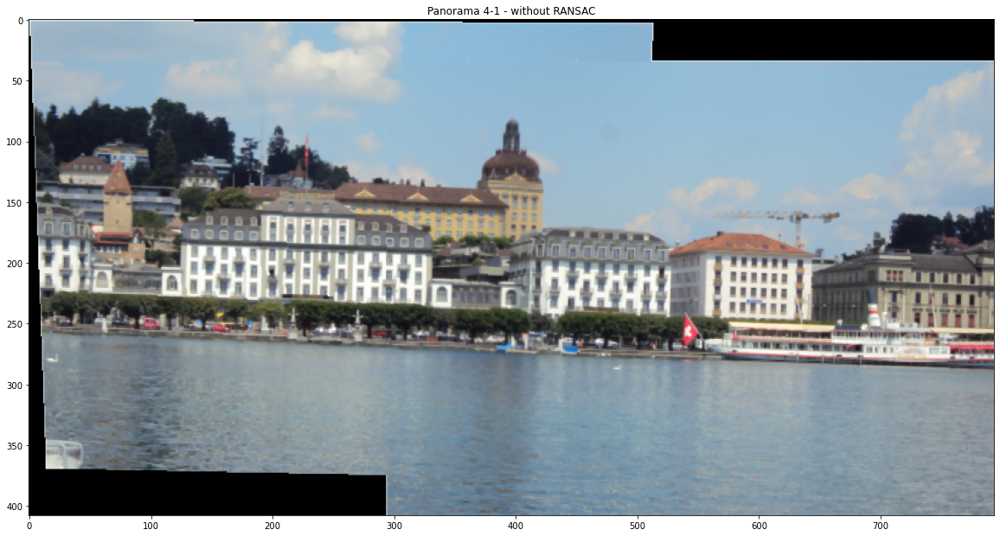

In [82]:
plt.figure(figsize = (20, 20))
plt.imshow(pan41)
plt.title("Panorama 4-1 - without RANSAC")
plt.savefig('pan41_noransac')

In [83]:
source_coords43 = []
for i in np.linspace(0,pier3.shape[0]-1,pier3.shape[0]):
    l = []
    for j in np.linspace(0,pier3.shape[1]-1,pier3.shape[1]):
        l.append([j, i, 1])
    source_coords43.append(l)
source_coords43 = np.array(source_coords43)
source_coords43.shape

(375, 501, 3)

In [84]:
pier43_matched = (source_coords43 @ H432.T)
pier43_matched /= pier43_matched[:, :, 2].reshape(-1, pier3.shape[1], 1)

In [85]:
pan42 = np.zeros((int((-pier41_matched[:, :, 1].min())) + int((pier43_matched[:, :, 1].max())) + 1, int((-pier41_matched[:, :, 0].min())) + int((pier43_matched[:, :, 0].max())) + 1, 3), dtype=np.uint8) * 255

h_offset = int((-pier41_matched[:, :, 1].min()))  
w_offset = int((-pier41_matched[:, :, 0].min()))

max_x1 = int((pier41_matched[:, :, 0].max()))

h_offset3 = int((-pier43_matched[:, :, 1].min()))  
w_offset3 = int((-pier43_matched[:, :, 0].min()))

min_x1 = int((pier43_matched[:, :, 0].min()))

for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan42[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan42[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan42[h_offset + i][w_offset + j][2] = pier2[i][j][2]
                     
for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        if int((pier41_matched[i][j][1])) >= 0 and int((pier41_matched[i][j][0])) >= 0:
            d_x = int((pier41_matched[i][j][0]))
            a2 = d_x / max_x1
            a1 = 1 - a2
            pan42[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][0] = a1 * pier1[i][j][0] + a2 * pier2[int((pier41_matched[i][j][1]))][int((pier41_matched[i][j][0]))][0]
            pan42[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][1] = a1 * pier1[i][j][1] + a2 * pier2[int((pier41_matched[i][j][1]))][int((pier41_matched[i][j][0]))][1]
            pan42[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][2] = a1 * pier1[i][j][2] + a2 * pier2[int((pier41_matched[i][j][1]))][int((pier41_matched[i][j][0]))][2]
        else:
            pan42[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][0] = pier1[i][j][0]
            pan42[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][1] = pier1[i][j][1]
            pan42[h_offset + int((pier41_matched[i][j][1]))][w_offset + int((pier41_matched[i][j][0]))][2] = pier1[i][j][2]

for i in range(pier3.shape[0]):
    for j in range(pier3.shape[1]):
        if int((pier43_matched[i][j][1])) < pier3.shape[0] and int((pier43_matched[i][j][0])) < pier3.shape[1]:
            d_x = pier2.shape[1] - int((pier43_matched[i][j][0]))
            a2 = d_x / (pier2.shape[1] - min_x1)
            a1 = 1 - a2
            pan42[h_offset + int((pier43_matched[i][j][1]))][w_offset + int((pier43_matched[i][j][0]))][0] = a1 * pier3[i][j][0] + a2 * pier2[int((pier43_matched[i][j][1]))][int((pier43_matched[i][j][0]))][0]
            pan42[h_offset + int((pier43_matched[i][j][1]))][w_offset + int((pier43_matched[i][j][0]))][1] = a1 * pier3[i][j][1] + a2 * pier2[int((pier43_matched[i][j][1]))][int((pier43_matched[i][j][0]))][1]
            pan42[h_offset + int((pier43_matched[i][j][1]))][w_offset + int((pier43_matched[i][j][0]))][2] = a1 * pier3[i][j][2] + a2 * pier2[int((pier43_matched[i][j][1]))][int((pier43_matched[i][j][0]))][2]
        else:
            pan42[h_offset + int((pier43_matched[i][j][1]))][w_offset + int((pier43_matched[i][j][0]))][0] = pier3[i][j][0]
            pan42[h_offset + int((pier43_matched[i][j][1]))][w_offset + int((pier43_matched[i][j][0]))][1] = pier3[i][j][1]
            pan42[h_offset + int((pier43_matched[i][j][1]))][w_offset + int((pier43_matched[i][j][0]))][2] = pier3[i][j][2]

pan42 = cv2.morphologyEx(pan42, cv2.MORPH_CLOSE, np.ones((2,2), np.uint8))

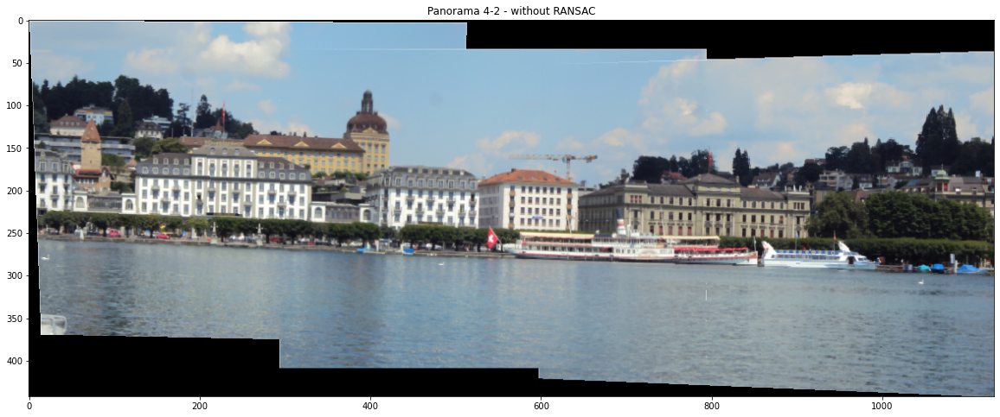

In [86]:
plt.figure(figsize = (20, 20))
plt.imshow(pan42)
plt.title("Panorama 4-2 - without RANSAC")
plt.savefig('pan42_noransac')

### If you’re not satisfied with both of the results, what are possible reasons?

Since the threshold coefficient for Lowe's ratio test during selecting good matches out of all of the matches is 0.2 and relatively restrictive, the results are satisfying. When the threshold coeffitient was 0.5 instead of 0.2, the results were horrible. Therefore selecting good matches at least by a method like Lowe's ratio test is necessary to get any reasonable result if RANSAC is not used. Still, the current results with coefficient of 0.2 beats my outputs with my manuelly extracted feature matches.

#### With Pier Panaroma with RANSAC

In order to eliminate outlier point correspondences with RANSAC, opencv's findHomography function is used with RANSAC in order to get a match mask. Then this mask is applied to the custom homography computation.

Below is the homography function which also gives A @ h (H flattened)'s mean absolute value as an error metric since in perfect homography it should be zero.

In [87]:
def homography2D_error(sources, dests):
    ndests = np.copy(dests)
    ndests[:, 2] = 1
    s_pts, s_T3 = normalise2Dpts(sources)
    t_pts, t_T3 = normalise2Dpts(ndests)
    A = get_A2n(s_pts, t_pts)
    u, s, v = np.linalg.svd(A)
    vec = v[-1].reshape(9, 1)
    H = vec.reshape((3, 3))
    H = np.linalg.inv(t_T3) @ (H @ s_T3)
    return H, np.abs((A @ vec).mean())

The obtained error results are compared for different RANSAC parameter support distance t values which are: 1, 5, 10, 25, 100

In [88]:
ht1_cv2, mt1_cv2 = cv2.findHomography(query12, train12, cv2.RANSAC, 1.0)
h_t1, err_t1 = homography2D_error(query12[mt1_cv2.astype(bool).squeeze(), :], train12[mt1_cv2.astype(bool).squeeze(), :])
print("Error for parameter t = 1 is: {}".format(err_t1))
ht5_cv2, mt5_cv2 = cv2.findHomography(query12, train12, cv2.RANSAC, 5.0)
h_t5, err_t5 = homography2D_error(query12[mt5_cv2.astype(bool).squeeze(), :], train12[mt5_cv2.astype(bool).squeeze(), :])
print("Error for parameter t = 5 is: {}".format(err_t5))
ht10_cv2, mt10_cv2 = cv2.findHomography(query12, train12, cv2.RANSAC, 10.0)
h_t10, err_t10 = homography2D_error(query12[mt10_cv2.astype(bool).squeeze(), :], train12[mt10_cv2.astype(bool).squeeze(), :])
print("Error for parameter t = 10 is: {}".format(err_t10))
ht25_cv2, mt25_cv2 = cv2.findHomography(query12, train12, cv2.RANSAC, 25.0)
h_t25, err_t25 = homography2D_error(query12[mt25_cv2.astype(bool).squeeze(), :], train12[mt25_cv2.astype(bool).squeeze(), :])
print("Error for parameter t = 25 is: {}".format(err_t25))
ht100_cv2, mt100_cv2 = cv2.findHomography(query12, train12, cv2.RANSAC, 100.0)
h_t100, err_t100 = homography2D_error(query12[mt100_cv2.astype(bool).squeeze(), :], train12[mt100_cv2.astype(bool).squeeze(), :])
print("Error for parameter t = 100 is: {}".format(err_t100))

Error for parameter t = 1 is: 1.3590916926293563e-08
Error for parameter t = 5 is: 1.3590916926293563e-08
Error for parameter t = 10 is: 1.3590916926293563e-08
Error for parameter t = 25 is: 1.7262557048209839e-06
Error for parameter t = 100 is: 1.7262557048209839e-06


It can be seen that as support distance t increase, error increases. But for the usually chosen range [1, 10] error is not sensitive and does not change. As a result t is chosen as 5.

In [89]:
h1_cv, m1_cv = cv2.findHomography(query12, train12, cv2.RANSAC, 5.0)
h2_cv, m2_cv = cv2.findHomography(query32, train32, cv2.RANSAC, 5.0)
H412_2 = homography2D(query12[m1_cv.astype(bool).squeeze(), :], train12[m1_cv.astype(bool).squeeze(), :])
H432_2 = homography2D(query32[m2_cv.astype(bool).squeeze(), :], train32[m2_cv.astype(bool).squeeze(), :])

In [90]:
pier412_matched = (source_coords41 @ H412_2.T)
pier412_matched /= pier412_matched[:, :, 2].reshape((-1, source_coords41.shape[1], 1))

pier432_matched = (source_coords43 @ H432_2.T)
pier432_matched /= pier432_matched[:, :, 2].reshape(-1, pier3.shape[1], 1)

In [91]:
pan43 = np.zeros((pier2.shape[0] + int((-pier412_matched[:, :, 1].min())), pier2.shape[1] + int((-pier412_matched[:, :, 0].min())), 3), dtype=np.uint8) * 255

h_offset = int((-pier412_matched[:, :, 1].min()))  
w_offset = int((-pier412_matched[:, :, 0].min()))

max_x = int((pier412_matched[:, :, 0].max()))

for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan43[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan43[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan43[h_offset + i][w_offset + j][2] = pier2[i][j][2]
                     
for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        if int((pier412_matched[i][j][1])) > 0 and int((pier412_matched[i][j][0])) > 0:
            d_x = int((pier412_matched[i][j][0]))
            a2 = d_x / max_x
            a1 = 1 - a2
            pan43[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][0] = a1 * pier1[i][j][0] + a2 * pier2[int((pier412_matched[i][j][1]))][int((pier412_matched[i][j][0]))][0]
            pan43[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][1] = a1 * pier1[i][j][1] + a2 * pier2[int((pier412_matched[i][j][1]))][int((pier412_matched[i][j][0]))][1]
            pan43[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][2] = a1 * pier1[i][j][2] + a2 * pier2[int((pier412_matched[i][j][1]))][int((pier412_matched[i][j][0]))][2]
        else:
            pan43[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][0] = pier1[i][j][0]
            pan43[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][1] = pier1[i][j][1]
            pan43[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][2] = pier1[i][j][2]

pan43 = cv2.morphologyEx(pan43, cv2.MORPH_CLOSE, np.ones((2,2),np.uint8))

In [92]:
pan44 = np.zeros((int((-pier412_matched[:, :, 1].min())) + int((pier432_matched[:, :, 1].max())) + 1, int((-pier412_matched[:, :, 0].min())) + int((pier432_matched[:, :, 0].max())) + 1, 3), dtype=np.uint8) * 255

h_offset = int((-pier412_matched[:, :, 1].min()))  
w_offset = int((-pier412_matched[:, :, 0].min()))

max_x1 = int((pier412_matched[:, :, 0].max()))

h_offset3 = int((-pier432_matched[:, :, 1].min()))  
w_offset3 = int((-pier432_matched[:, :, 0].min()))

min_x1 = int((pier432_matched[:, :, 0].min()))

for i in range(pier2.shape[0]):
    for j in range(pier2.shape[1]):
        pan44[h_offset + i][w_offset + j][0] = pier2[i][j][0]
        pan44[h_offset + i][w_offset + j][1] = pier2[i][j][1]
        pan44[h_offset + i][w_offset + j][2] = pier2[i][j][2]
                     
for i in range(pier1.shape[0]):
    for j in range(pier1.shape[1]):
        if int((pier412_matched[i][j][1])) >= 0 and int((pier412_matched[i][j][0])) >= 0:
            d_x = int((pier412_matched[i][j][0]))
            a2 = d_x / max_x1
            a1 = 1 - a2
            pan44[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][0] = a1 * pier1[i][j][0] + a2 * pier2[int((pier412_matched[i][j][1]))][int((pier412_matched[i][j][0]))][0]
            pan44[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][1] = a1 * pier1[i][j][1] + a2 * pier2[int((pier412_matched[i][j][1]))][int((pier412_matched[i][j][0]))][1]
            pan44[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][2] = a1 * pier1[i][j][2] + a2 * pier2[int((pier412_matched[i][j][1]))][int((pier412_matched[i][j][0]))][2]
        else:
            pan44[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][0] = pier1[i][j][0]
            pan44[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][1] = pier1[i][j][1]
            pan44[h_offset + int((pier412_matched[i][j][1]))][w_offset + int((pier412_matched[i][j][0]))][2] = pier1[i][j][2]

for i in range(pier3.shape[0]):
    for j in range(pier3.shape[1]):
        if int((pier432_matched[i][j][1])) < pier3.shape[0] and int((pier432_matched[i][j][0])) < pier3.shape[1]:
            d_x = pier2.shape[1] - int((pier432_matched[i][j][0]))
            a2 = d_x / (pier2.shape[1] - min_x1)
            a1 = 1 - a2
            pan44[h_offset + int((pier432_matched[i][j][1]))][w_offset + int((pier432_matched[i][j][0]))][0] = a1 * pier3[i][j][0] + a2 * pier2[int((pier432_matched[i][j][1]))][int((pier432_matched[i][j][0]))][0]
            pan44[h_offset + int((pier432_matched[i][j][1]))][w_offset + int((pier432_matched[i][j][0]))][1] = a1 * pier3[i][j][1] + a2 * pier2[int((pier432_matched[i][j][1]))][int((pier432_matched[i][j][0]))][1]
            pan44[h_offset + int((pier432_matched[i][j][1]))][w_offset + int((pier432_matched[i][j][0]))][2] = a1 * pier3[i][j][2] + a2 * pier2[int((pier432_matched[i][j][1]))][int((pier432_matched[i][j][0]))][2]
        else:
            pan44[h_offset + int((pier432_matched[i][j][1]))][w_offset + int((pier432_matched[i][j][0]))][0] = pier3[i][j][0]
            pan44[h_offset + int((pier432_matched[i][j][1]))][w_offset + int((pier432_matched[i][j][0]))][1] = pier3[i][j][1]
            pan44[h_offset + int((pier432_matched[i][j][1]))][w_offset + int((pier432_matched[i][j][0]))][2] = pier3[i][j][2]

pan44 = cv2.morphologyEx(pan44, cv2.MORPH_CLOSE, np.ones((2,2), np.uint8))

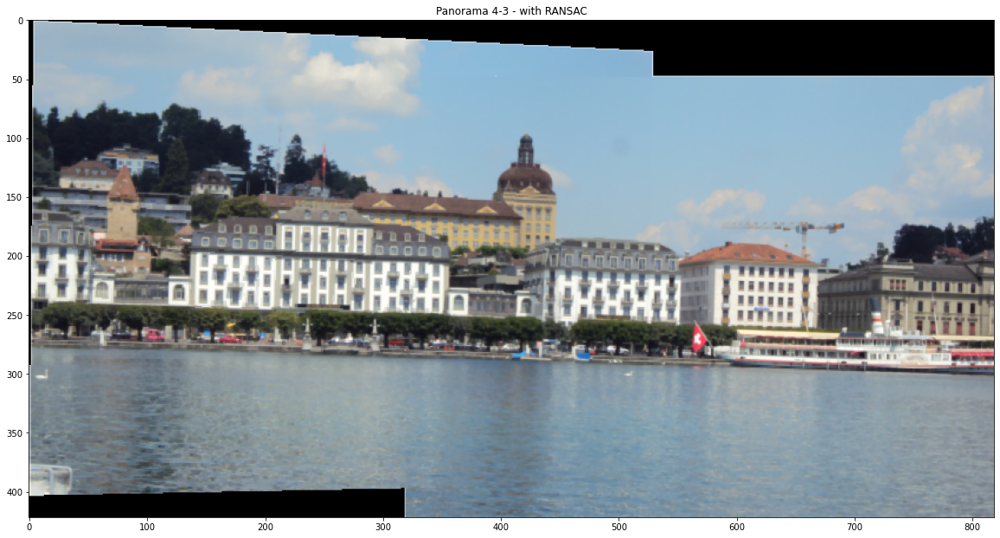

In [93]:
plt.figure(figsize = (20, 20))
plt.imshow(pan43)
plt.title("Panorama 4-3 - with RANSAC")
plt.savefig('pan43_ransac')

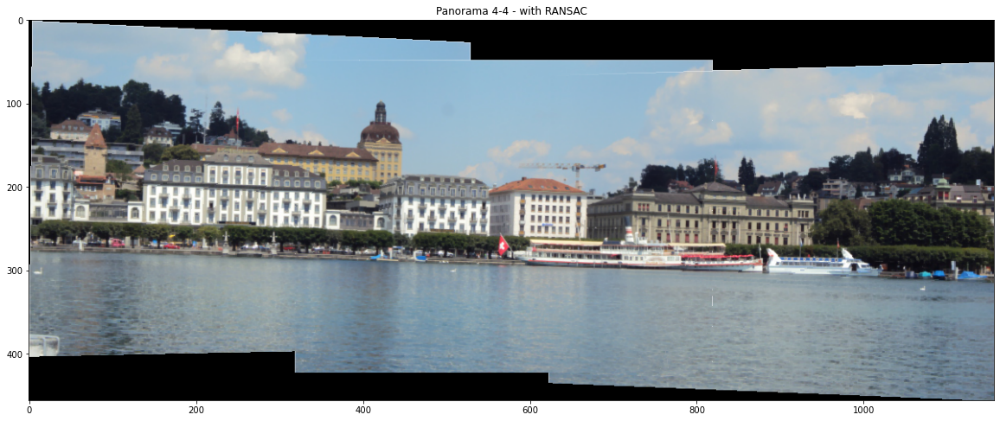

In [94]:
plt.figure(figsize = (20, 20))
plt.imshow(pan44)
plt.title("Panorama 4-4 - with RANSAC")
plt.savefig('pan44_ransac')

### Compare your panaroma result to the one in Task 2 and 3. Did your result improve? Comment why or why not.

Panorama results with RANSAC are definitely better than panorama results with manually selected point matches or wit sift based feature matching without RANSAC. It is natural that the results would improve, because in my manuel point matching the coordinate point errors are high while SIFT based feature matching has matches with far less coordinate point errors. Using RANSAC improves SIFT based feature matching homography results because as a result of SIFT feature matching there may be outlier points which give rise coordinate point errors. But by using RANSAC and eliminating as much as these outlier points, we reduce the coordinate point errors during matching.

### In addition to the given Pier images, use selected Hagia Sofia images from CVPR Image Matching Challenge1 given in Figure 4. How are the results compared to the previous ones? Could you improve the results using some preprocessing?


In [95]:
img1 = plt.imread('hw2_material/task4_img1.jpg')
img2 = plt.imread('hw2_material/task4_img2.jpg')

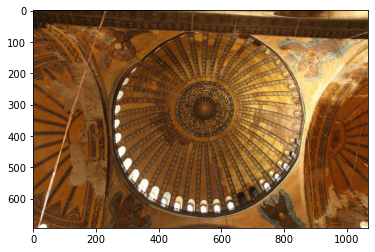

In [96]:
plt.imshow(img1)

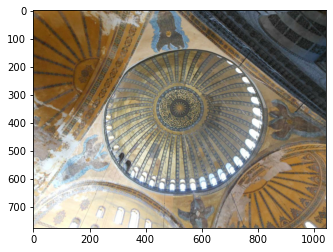

In [97]:
plt.imshow(img2)

In [98]:
kp_1, dc_1 = sift.detectAndCompute(img1, None)
kp_2, dc_2 = sift.detectAndCompute(img2, None)

In [99]:
matches3 = flann.knnMatch(dc_1, dc_2, k=2)

good3 = []
for m, n in matches3:
    if m.distance < 0.5 * n.distance:
        good3.append(m)
        
query3 = [[kp_1[match.queryIdx].pt[0], kp_1[match.queryIdx].pt[1], 1] for match in good3]
query3 = np.array(query3)
train3 = [[kp_2[match.trainIdx].pt[0], kp_2[match.trainIdx].pt[1], 1] for match in good3]
train3 = np.array(train3)

In [100]:
len(good3)

72

In [101]:
h5_cv, m5_cv = cv2.findHomography(query3, train3, cv2.RANSAC, 5.0)
H5 = homography2D(query3[m5_cv.astype(bool).squeeze(), :], train3[m5_cv.astype(bool).squeeze(), :])

In [102]:
source_coords5 = np.array([[(j, i, 1) for j in np.linspace(0,img1.shape[1]-1,img1.shape[1])] for i in np.linspace(0,img1.shape[0]-1,img1.shape[0])])

In [103]:
img1_matched = (source_coords5 @ H5.T)
img1_matched /= img1_matched[:, :, 2].reshape(-1, img1.shape[1], 1)

In [104]:
fhs = np.zeros((int((-img1_matched[:, :, 1].min())) + max(img2.shape[0], int((img1_matched[:, :, 1].max()))) + 1, int((-img1_matched[:, :, 0].min())) + max(img2.shape[1], int((img1_matched[:, :, 0].max()))) + 1, 3), dtype=np.uint8) * 255

h_offset = int((-img1_matched[:, :, 1].min()))  
w_offset = int((-img1_matched[:, :, 0].min()))

for i in range(img2.shape[0]):
    for j in range(img2.shape[1]):
        fhs[h_offset + i][w_offset + j][0] = img2[i][j][0]
        fhs[h_offset + i][w_offset + j][1] = img2[i][j][1]
        fhs[h_offset + i][w_offset + j][2] = img2[i][j][2]
                     
for i in range(img1.shape[0]):
    for j in range(img1.shape[1]):
        fhs[h_offset + int((img1_matched[i][j][1]))][w_offset + int((img1_matched[i][j][0]))][0] = img1[i][j][0]
        fhs[h_offset + int((img1_matched[i][j][1]))][w_offset + int((img1_matched[i][j][0]))][1] = img1[i][j][1]
        fhs[h_offset + int((img1_matched[i][j][1]))][w_offset + int((img1_matched[i][j][0]))][2] = img1[i][j][2]
fhs = cv2.morphologyEx(fhs, cv2.MORPH_CLOSE, np.ones((2,2), np.uint8))

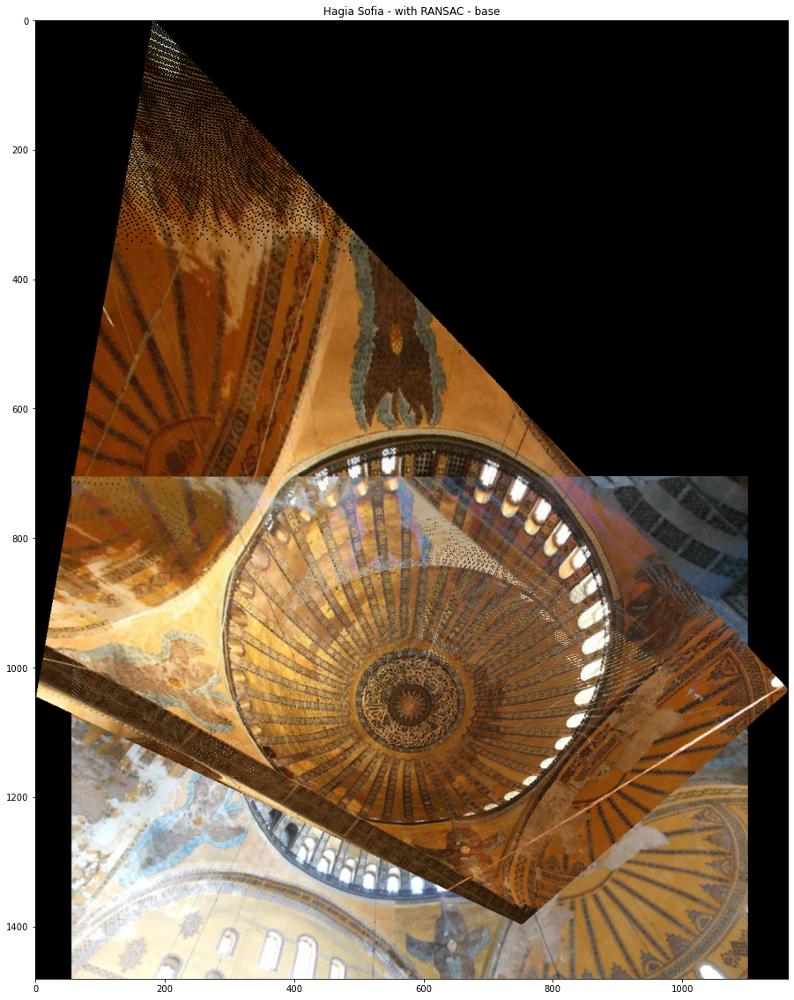

In [105]:
plt.figure(figsize = (20, 20))
plt.imshow(fhs)
plt.title("Hagia Sofia - with RANSAC - base")
plt.savefig('hagiasofia_ransac_base')

### How are the results compared to the previous ones?

Apparently really bad in comparison with the previous panaroma results. The direction and the place to copy and match is roughly correct, but the error is so high that corresponding points are very far from each other.

### Could you improve the results using some preprocessing?

The same process is repeated below with some previous preprocessing. The images are converted to their gray scale versions and then filtered by a bilateral filter to reduce noise. Then matches are computed according to these preprocessed images.

In [106]:
img1_g = cv2.imread('hw2_material/task4_img1.jpg', cv2.IMREAD_GRAYSCALE)
img2_g = cv2.imread('hw2_material/task4_img2.jpg', cv2.IMREAD_GRAYSCALE)
img1_g = cv2.bilateralFilter(img1_g, 5, 75,75)
img2_g = cv2.bilateralFilter(img2_g, 5, 75,75)

Image 1 grayscale and filtered:

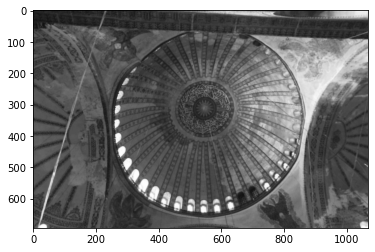

In [107]:
plt.imshow(img1_g, cmap='gray', vmin=0, vmax=255)

Image 2 grayscale and filtered:

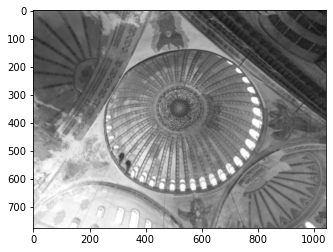

In [108]:
plt.imshow(img2_g, cmap='gray', vmin=0, vmax=255)

In [109]:
kp_21, dc_21 = sift.detectAndCompute(img1_g, None)
kp_22, dc_22 = sift.detectAndCompute(img2_g, None)

In [110]:
matches4 = flann.knnMatch(dc_21, dc_22, k=2)

good4 = []
for m, n in matches4:
    if m.distance < 0.5 * n.distance:
        good4.append(m)
        
query4 = [[kp_21[match.queryIdx].pt[0], kp_21[match.queryIdx].pt[1], 1] for match in good4]
query4 = np.array(query4)
train4 = [[kp_22[match.trainIdx].pt[0], kp_22[match.trainIdx].pt[1], 1] for match in good4]
train4 = np.array(train4)

In [111]:
len(good4)

113

In [112]:
h6_cv, m6_cv = cv2.findHomography(query4, train4, cv2.RANSAC, 5.0)
H6 = homography2D(query4[m6_cv.astype(bool).squeeze(), :], train4[m6_cv.astype(bool).squeeze(), :])

In [113]:
source_coords6 = np.array([[(j, i, 1) for j in np.linspace(0,img1.shape[1]-1,img1.shape[1])] for i in np.linspace(0,img1.shape[0]-1,img1.shape[0])])

In [114]:
img1g_matched = (source_coords6 @ H6.T)
img1g_matched /= img1g_matched[:, :, 2].reshape(-1, img1_g.shape[1], 1)

In [115]:
fhs_g = np.zeros((int((-img1g_matched[:, :, 1].min())) + max(img2.shape[0], int((img1g_matched[:, :, 1].max()))) + 1, int((-img1g_matched[:, :, 0].min())) + max(img2.shape[1], int((img1g_matched[:, :, 0].max()))) + 1, 3), dtype=np.uint8) * 255

h_offset = int((-img1g_matched[:, :, 1].min()))  
w_offset = int((-img1g_matched[:, :, 0].min()))

for i in range(img2.shape[0]):
    for j in range(img2.shape[1]):
        fhs_g[h_offset + i][w_offset + j][0] = img2[i][j][0]
        fhs_g[h_offset + i][w_offset + j][1] = img2[i][j][1]
        fhs_g[h_offset + i][w_offset + j][2] = img2[i][j][2]
                     
for i in range(img1.shape[0]):
    for j in range(img1.shape[1]):
        fhs_g[h_offset + int((img1g_matched[i][j][1]))][w_offset + int((img1g_matched[i][j][0]))][0] = img1[i][j][0]
        fhs_g[h_offset + int((img1g_matched[i][j][1]))][w_offset + int((img1g_matched[i][j][0]))][1] = img1[i][j][1]
        fhs_g[h_offset + int((img1g_matched[i][j][1]))][w_offset + int((img1g_matched[i][j][0]))][2] = img1[i][j][2]
fhs_g = cv2.morphologyEx(fhs_g, cv2.MORPH_CLOSE, np.ones((2,2), np.uint8))

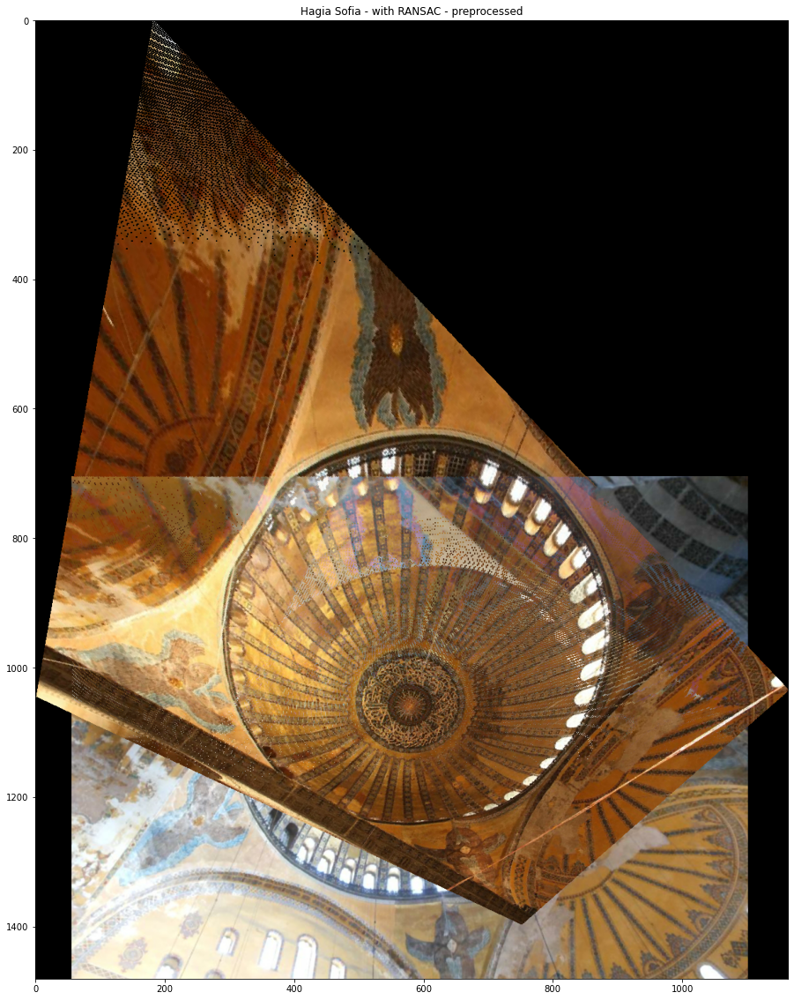

In [116]:
plt.figure(figsize = (20, 20))
plt.imshow(fhs)
plt.title("Hagia Sofia - with RANSAC - preprocessed")
plt.savefig('hagiasofia_ransac_preprocessed')

This preprocessing does not give any improvement. The necessary and useful type of preprocessing needs to be searched further.